# Exploration


# Strategy


- Que faire des doubles dans la colonne N° Opportunité ?
- Pourquoi y a-t-il toujours une date de cloture ? Est-ce une date estimée ?
- Dans la colonne 'Nom du compte', il y a en champ 'DOUBLON NE PAS UTILISER'. Est-ce une indication pour moi ?
- Ai-je le droit d'utiliser les informations sur les employés dans l'algorithme ? Les noms et prénoms des clients ?

- Comment catégoriser 'Étape' ?
  0- Etude amont / Budget 2430
  1- Priorisation 27
  2- Dépôt de candidature 30
  3- Réponse en préparation 1316
  4- Réponse envoyée 8565
  5- Négociation prix 286
  6- Gagnée 19978
  7- Perdue 21379
  8- Perdue archivée 8226
  9- Gagnée archivée 1620


Plan:

- Drop double in 'N° Opportunité' (63857 to 46185 rows)
- Drop 'N° Opportunité' (clef)
- Drop 'Nom de l'opportunité' (clef, analyse plus tard?)
- Drop 'Date de clôture' (information tirée du futur)
- Drop 'Date de création' et 'Date de dernière modification'
- Drop 'Date de démarrage estimé de l'affaire' (58161 Nan over 63864)
- Drop 'Durée estimée du chantier (nb mois)' (61167 Nan over 63864)
- Convert 'Montant' to float
- Drop rows where 'Montant' is Nan
- Drop 'Probabilité (%)'
- Drop 'Nom du compte' (Texte complexe)
- One hot 'Activité' (56 valeurs différentes)
- Drop 'Resp.' (135 employés différents) et 'Resp..1' (136 valeurs ?)
- Drop 'Prénom' and 'Nom'
- Drop 'Rôle du contact' (18 valeurs différentes, moitié de Nan)
- Drop 'Motif si perdue' (information tirée du futur)
- One hot 'Origine de l'opportunité' (8 valeurs différentes)
- Drop 'Locaux' (32 valeurs différentes)
- One hot 'Opération' (2 valeurs)
- One hot 'Domaine' (2 valeurs)
- One hot 'Position' (2 valeurs)
- One hot 'Type du compte' (6 valeurs dont 442 Nan)
- A voir pour 'Étape'
- Drop 'Ville' (7142 villes différentes)

- Import Staff
- One hot 'sDiplomeFinal' (6 valeurs)
- One hot 'sFicheDePoste' (10 valeurs)
- Create 'Age'
- Create 'Anciennete'
- Join table Staff
- Drop 'Resp.' and 'Resp..1'

Futur:

- Travailler sur 'Locaux'
- Travailler sur 'Ville' (Ajouter des données géographiques, densité, prix au m^2, population, etc.)
- Travailler sur 'Nom du compte' ("Ville, entreprise, taille de l'entreprise, etc)
- Ajouter stats de l'employé, stats de l'entreprise


# Visualization


In [1]:
# Plot PCA of data with labels on plotly
import pandas as pd
import numpy as np
from scipy import stats

from src.data_cleaning.controller import load_opportunities

df = load_opportunities()

df.dropna(inplace=True)

labels = df["Label"]
df = df.drop("Label", axis=1)

filter_mask = np.abs(stats.zscore(df["Montant"])) < 3
df = df[filter_mask]
labels = labels[filter_mask]


# Normalize data

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

normalized_df = scaler.fit_transform(df)

from sklearn.decomposition import PCA

pca = PCA(n_components=2)

pca.fit(normalized_df)

df_pca = pca.transform(normalized_df)

import plotly.express as px

fig = px.scatter(
    x=df_pca[:, 0],
    y=df_pca[:, 1],
    color=labels,
    color_continuous_scale=px.colors.sequential.Viridis,
)
# title
fig.update_layout(title={"text": "PCA of opportunities"})

fig.show()

c:\Users\cleme\OneDrive\Bureau\mission\etandex-jcs\src\data_cleaning\controller.py:162: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  insee_line["Code Postal"] = line["code_postal"]
c:\Users\cleme\OneDrive\Bureau\mission\etandex-jcs\src\data_cleaning\controller.py:173: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  insee_line["Code Postal"] = line["code_postal"]


In [2]:
# print PCA vectors

print(pca.components_)
print(pca.explained_variance_ratio_)

[[ 1.34982064e-01 -3.33085697e-01 -6.79801591e-02  3.68494338e-01
   5.40261411e-02  2.54019370e-01  1.15111478e-02 -2.85936395e-01
   5.66428781e-02  5.03015189e-02  4.12818436e-02 -2.24953793e-04
  -4.06207815e-01  5.74765473e-03  3.74926606e-02  3.85407457e-01
   9.72232635e-03 -4.36068959e-03 -1.18055627e-02  2.90466538e-03
   4.11166149e-03 -2.99806539e-02 -1.97738031e-01 -1.05314585e-02
  -5.09386149e-02  5.34674966e-03 -3.40507320e-03 -7.26312620e-02
  -2.52741452e-03  1.33561889e-03 -2.44962866e-02 -1.39211898e-03
  -5.05153842e-02 -2.55239180e-02  2.03520342e-02 -5.75050914e-03
  -9.16176629e-02 -2.15134655e-02 -1.95970222e-02  3.71322078e-02
   1.34754665e-01 -6.45004345e-03  9.76329764e-04 -7.98058521e-03
  -2.67849416e-02  3.79378112e-02  2.76900861e-02  1.31417733e-01
  -1.85707599e-02  9.81070827e-03  1.35790557e-02  2.55612119e-03
   1.90039423e-02  2.93581618e-02  2.73565845e-03  2.44266273e-03
   3.30141117e-03  2.59988322e-03  1.62448921e-03  1.75127462e-03
   1.47470

In [5]:
# Plot TSNE of data with labels on plotly

import pandas as pd
import numpy as np
from scipy import stats

from src.data_cleaning.controller import load_opportunities


df = load_opportunities()
df.dropna(inplace=True)

labels = df["Label"]
df = df.drop("Label", axis=1)

filter_mask = np.abs(stats.zscore(df["Montant"])) < 3
df = df[filter_mask]
labels = labels[filter_mask]

# Normalize data

# from sklearn.preprocessing import StandardScaler

# scaler = StandardScaler()

# normalized_df = scaler.fit_transform(df)

from sklearn.manifold import TSNE


tsne = TSNE(n_components=2)

df_tsne = tsne.fit_transform(df)

import plotly.express as px

fig = px.scatter(
    x=df_tsne[:, 0],
    y=df_tsne[:, 1],
    color=labels,
    color_continuous_scale=px.colors.sequential.Viridis,
)

fig.update_layout(title={"text": "TSNE of opportunities"})

fig.show()

c:\Users\cleme\OneDrive\Bureau\mission\etandex-jcs\src\data_cleaning\controller.py:160: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\cleme\OneDrive\Bureau\mission\etandex-jcs\src\data_cleaning\controller.py:171: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Index(['Montant', 'Opération_Opération_NF', 'Domaine_Domaine_BT',
       'Position_Position_DR', 'Origine de l'opportunité_Appel d'offre privé',
       'Origine de l'opportunité_Appel d'offre public',
       'Origine de l'opportunité_Chantier vu',
       'Origine de l'opportunité_Consultation directe ancien Client',
       'Origine de l'opportunité_Consultation directe nouveau Client',
       'Origine de l'opportunité_Conversation',
       ...
       'sFicheDePoste_IngÃ©nieur Travaux ConfirmÃ©', 'age', 'anciennete',
       'Code INSEE', 'Altitude Moyenne', 'Superficie', 'Population', 'densite',
       'longitude', 'latitude'],
      dtype='object', length=114)


In [2]:
# Plot correlation between labels and each feature

import pandas as pd
import numpy as np
from scipy import stats

from src.data_cleaning.controller import load_opportunities


df = load_opportunities()
df.dropna(inplace=True)

labels = df["Label"]
df = df.drop("Label", axis=1)

filter_mask = np.abs(stats.zscore(df["Montant"])) < 3
df = df[filter_mask]
labels = labels[filter_mask]

# Plot correlation between labels and each feature

from sklearn.feature_selection import r_regression


correlations = r_regression(df.astype(float), labels.values.astype(float))


# Order correlations by absolute value and plot best 30

ordered_correlations = np.argsort(np.abs(correlations))

indices = ordered_correlations[-30:]

import plotly.express as px

fig = px.bar(
    x=df.columns[indices],
    y=correlations[indices],
    color=correlations[indices],
    color_continuous_scale=px.colors.sequential.Viridis,
)

fig.update_layout(title={"text": "Correlation between labels and each feature"})

fig.show()

c:\Users\cleme\OneDrive\Bureau\mission\etandex-jcs\src\data_cleaning\controller.py:162: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\cleme\OneDrive\Bureau\mission\etandex-jcs\src\data_cleaning\controller.py:173: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Algorithm


In [3]:
# train logistic regression

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

from src.data_cleaning.controller import load_train_test_split

X_train, y_train, X_test, y_test = load_train_test_split(drop_na=True)

clf = LogisticRegression(random_state=0).fit(X_train, y_train)

print(accuracy_score(y_train, clf.predict(X_train)))
print(accuracy_score(y_test, clf.predict(X_test)))

c:\Users\cleme\OneDrive\Bureau\mission\etandex-jcs\src\data_cleaning\controller.py:162: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\cleme\OneDrive\Bureau\mission\etandex-jcs\src\data_cleaning\controller.py:173: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



0.6519359416176769
0.6520188097940652


c:\Users\cleme\OneDrive\Bureau\mission\etandex-jcs\src\data_cleaning\controller.py:162: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\cleme\OneDrive\Bureau\mission\etandex-jcs\src\data_cleaning\controller.py:173: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



0.7963105615244274
0.6985568347656883


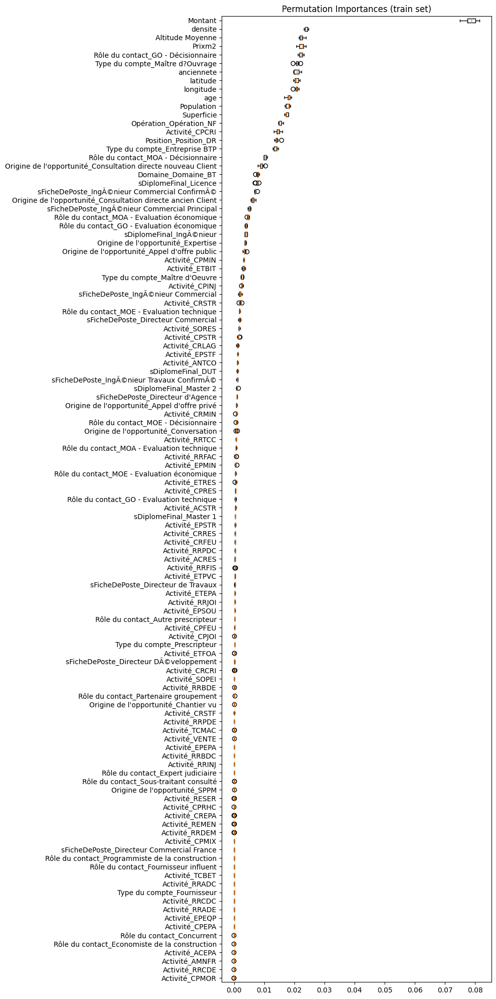

In [4]:
# train random forest

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

from src.data_cleaning.controller import load_train_test_split

X_train, y_train, X_test, y_test = load_train_test_split(drop_na=True)

clf = RandomForestClassifier(max_depth=15, random_state=0).fit(X_train, y_train)

print(accuracy_score(y_train, clf.predict(X_train)))
print(accuracy_score(y_test, clf.predict(X_test)))

# Explain random forest

from sklearn.inspection import permutation_importance

result = permutation_importance(clf, X_train, y_train, n_repeats=10, random_state=42)

sorted_idx = result.importances_mean.argsort()

import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 20))

ax.boxplot(
    result.importances[sorted_idx].T, vert=False, labels=X_train.columns[sorted_idx]
)
ax.set_title("Permutation Importances (train set)")
fig.tight_layout()
plt.show()

In [9]:
# train xgboost

import xgboost as xgb
from sklearn.metrics import accuracy_score

from src.data_cleaning.controller import load_train_test_split

X_train, y_train, X_test, y_test = load_train_test_split()


clf = xgb.XGBClassifier().fit(X_train, y_train)

print(accuracy_score(y_train, clf.predict(X_train)))

print(accuracy_score(y_test, clf.predict(X_test)))


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0.8024695266740541
0.6869697353425351


<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

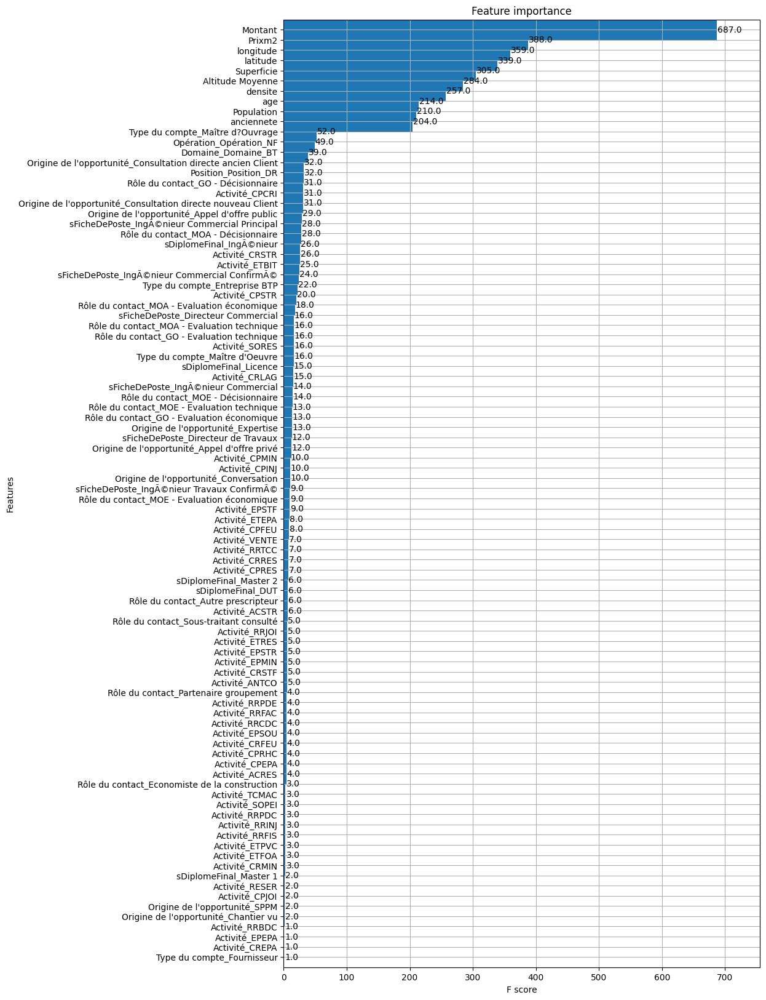

In [6]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 20))


xgb.plot_importance(clf, ax=ax, height=2)

c:\Users\cleme\OneDrive\Bureau\mission\etandex-jcs\src\data_cleaning\controller.py:162: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

c:\Users\cleme\OneDrive\Bureau\mission\etandex-jcs\src\data_cleaning\controller.py:173: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 11170, number of negative: 20415
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002090 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2398
[LightGBM] [Info] Number of data points in the train set: 31585, number of used features: 103
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.353649 -> initscore=-0.603038
[LightGBM] [Info] Start training from score -0.603038
0.740161469051765
0.6969735342535139


<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

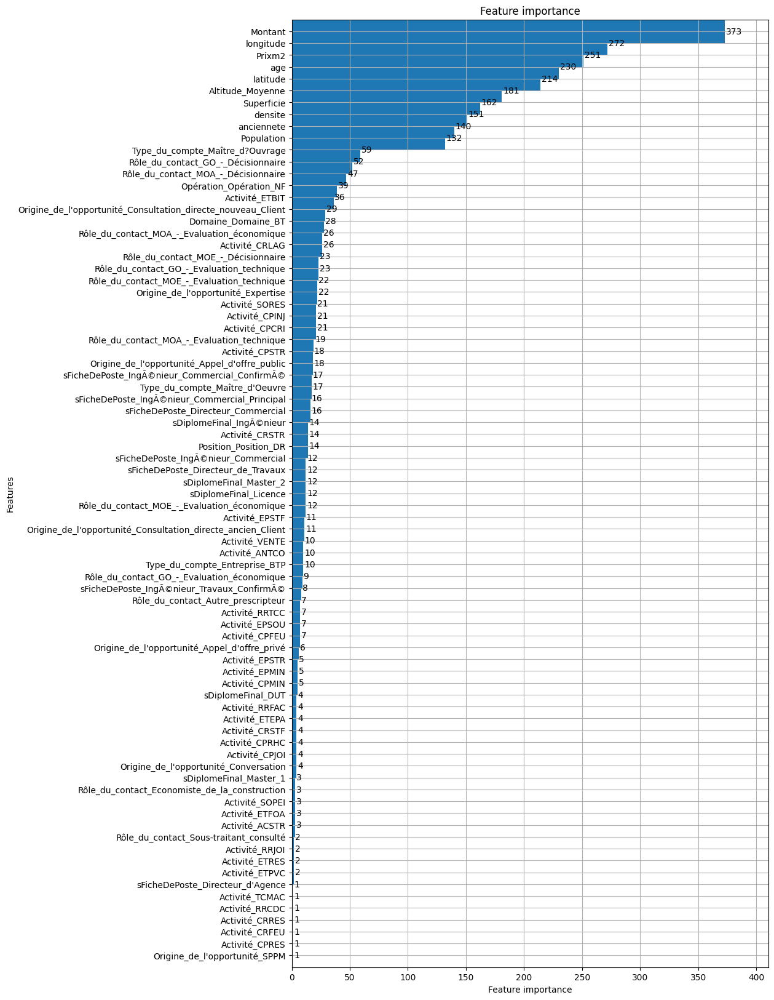

In [7]:
# train lightgbm

import lightgbm as lgb
from sklearn.metrics import accuracy_score

from src.data_cleaning.controller import load_train_test_split

X_train, y_train, X_test, y_test = load_train_test_split()

clf = lgb.LGBMClassifier().fit(X_train, y_train)

print(accuracy_score(y_train, clf.predict(X_train)))

print(accuracy_score(y_test, clf.predict(X_test)))

import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 20))

lgb.plot_importance(clf, ax=ax, height=2)

In [10]:
# shap
import shap

shap.initjs()

explainer = shap.TreeExplainer(clf)

shap_values = explainer.shap_values(X_test)

shap.force_plot(
    explainer.expected_value,
    shap_values[0],
    features=X_test.iloc[0],
    feature_names=X_test.columns,
)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


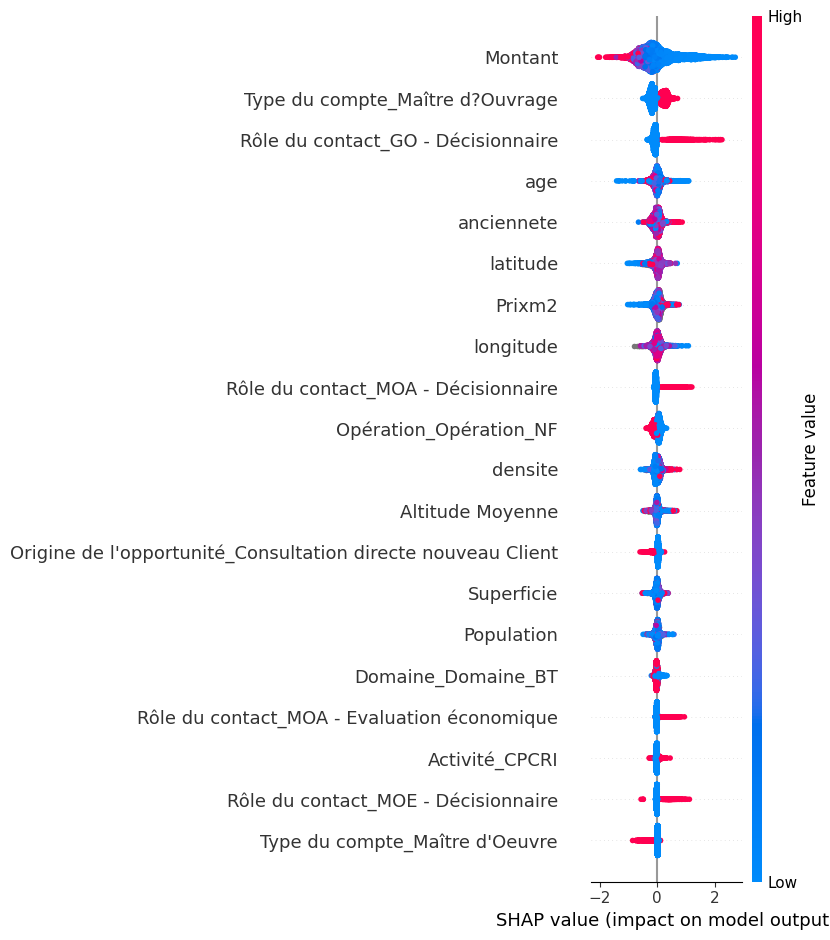

In [11]:
shap.initjs()
shap.summary_plot(shap_values, features=X_test, feature_names=X_test.columns)

In [ ]:
# lime
# works only with no Nan values

from lime import lime_tabular


explainer = lime_tabular.LimeTabularExplainer(
    X_train.values,
    mode="regression",
    training_labels=y_train,
    feature_names=X_train.columns,
    verbose=True,
)

sample = X_test.iloc[0]
exp = explainer.explain_instance(sample, clf.predict, num_features=10)
print(exp.as_list())
exp.show_in_notebook(show_table=False)

In [26]:
print(np.count_nonzero(clf.predict(X_test.values)))
print(len(clf.predict(X_test.values)))
print(np.where(clf.predict(X_test.values) == 1))

6633
28826
(array([    0,    10,    25, ..., 28819, 28824, 28825], dtype=int64),)


In [13]:
# anchors

from anchor import anchor_tabular

explainer = anchor_tabular.AnchorTabularExplainer(
    ["perdue", "gagnée"],
    X_train.columns,
    X_train.values,
)

idx = 10

print(clf.predict_proba(np.array(X_test.iloc[idx]).reshape(1, -1)))

exp = explainer.explain_instance(
    np.array(X_test.iloc[idx]), clf.predict, threshold=0.95
)

exp.show_in_notebook()

invalid value encountered in reduce


[[0.6366445  0.36335555]]


# Retard chantiers


In [112]:
from src.data_cleaning.controller import load_opportunities_for_chantiers

joint = load_opportunities_for_chantiers()

# plot histogram of "duree_travaux"

print(joint["duree_travaux"].mean())
print(joint["duree_travaux"].var())

import plotly.express as px

fig = px.histogram(joint, x="duree_travaux", nbins=100)

fig.show()

11.558161970043159
128.42148630127505


In [113]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

duree = joint["duree_travaux"].astype(float)
features = joint.drop("duree_travaux", axis=1)

for col in features.columns:
    if features[col].dtype == "object":
        features[col] = pd.to_numeric(features[col])

X_train, X_test, y_train, y_test = train_test_split(
    features, duree, test_size=0.2, random_state=42
)

25.122988416496476
68.90340374939343
165.19977162680865


<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

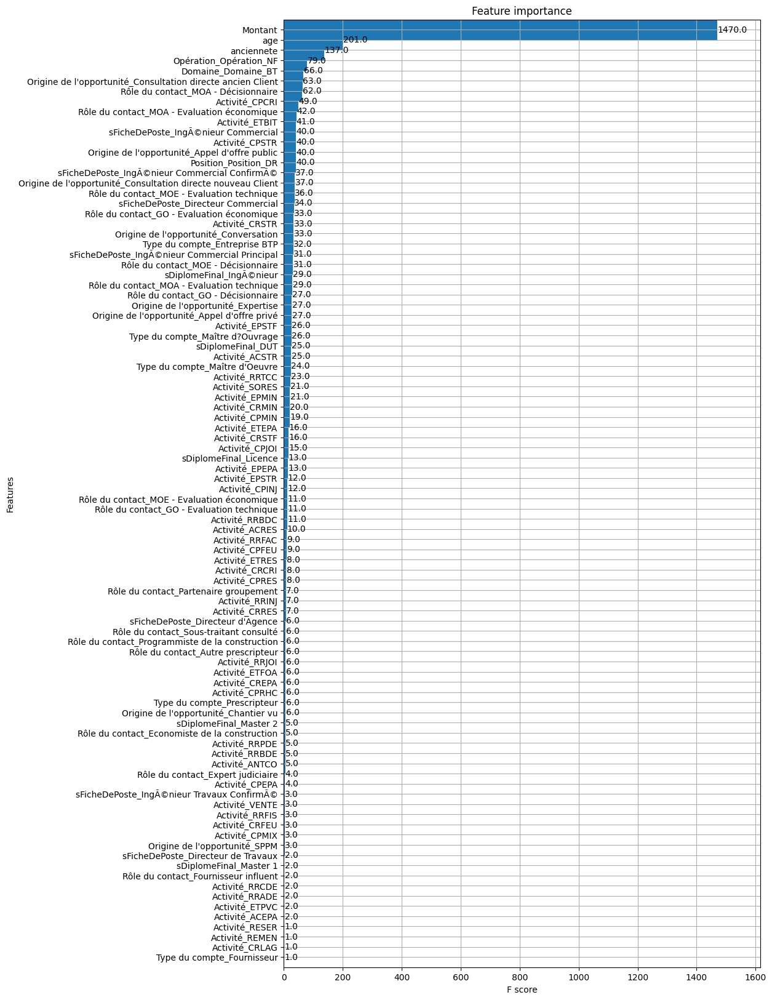

In [114]:
# train xgboost regressor
from sklearn.metrics import mean_squared_error
import xgboost as xgb

reg = xgb.XGBRegressor().fit(X_train, y_train)


# evaluate average error
print(mean_squared_error(reg.predict(X_train), y_train))
print(mean_squared_error(reg.predict(X_test), y_test))

print(np.square(np.array((reg.predict(X_test) - y_test) / y_test)).mean())

# plot error distribution

import plotly.express as px

fig = px.histogram(
    x=np.abs(reg.predict(X_train) - y_train),
    nbins=100,
)

fig.show()

fig = px.histogram(
    x=np.abs(reg.predict(X_test) - y_test),
    nbins=100,
)

fig.show()


fig = px.histogram(
    x=np.abs((reg.predict(X_test) - y_test) / y_test),
    nbins=100,
)

fig.show()


# plot feature importance
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 20))

xgb.plot_importance(reg, ax=ax, height=2)